In [33]:
import numpy as np
import os
import matplotlib.pyplot as plt
import glob
import cv2
import models
from tqdm import tqdm
import torch
from PIL import Image
from torchvision.transforms import transforms
from torchvision.utils import save_image

In [34]:
# Specify the path to your text file containing image names
file_path = "../test_data/test_set_diff_split_our_dataset.txt"

# Read image names from the file
with open(file_path, 'r') as file:
    test_images = [line.strip() for line in file]

Using the model trained on 51x51 images, we get bad results:

In [35]:
def save_decoded_image(img, name):
    img = img.view(img.size(0), 3, 224, 224)
    save_image(img, name)

device = 'cpu'

# load the trained model
model = models.CNN().to(device).eval()
model.load_state_dict(torch.load('../outputs/model_diff_split_our_dataset.pth', map_location=torch.device('cpu')))

# define transforms
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

In [36]:
iterations = 0

for name in test_images:
    if iterations >= 9:
        break
    image = cv2.imread(f"../input/gaussian_blurred/{name}")
    orig_image = image.copy()
    orig_image = cv2.resize(orig_image, (224, 224))
    #cv2.imwrite(f"../outputs/test_deblurred_images/blurred_{name}", orig_image)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    image = transform(image).unsqueeze(0)
    print(image.shape)

    with torch.no_grad():
        outputs = model(image)
        save_decoded_image(outputs.cpu().data, name=f"../outputs/test_deblurred_images/deblurred_{name}")


    iterations += 1
    #print(image.shape)



torch.Size([1, 3, 224, 224])


torch.Size([1, 3, 224, 224])
torch.Size([1, 3, 224, 224])
torch.Size([1, 3, 224, 224])
torch.Size([1, 3, 224, 224])
torch.Size([1, 3, 224, 224])
torch.Size([1, 3, 224, 224])
torch.Size([1, 3, 224, 224])
torch.Size([1, 3, 224, 224])


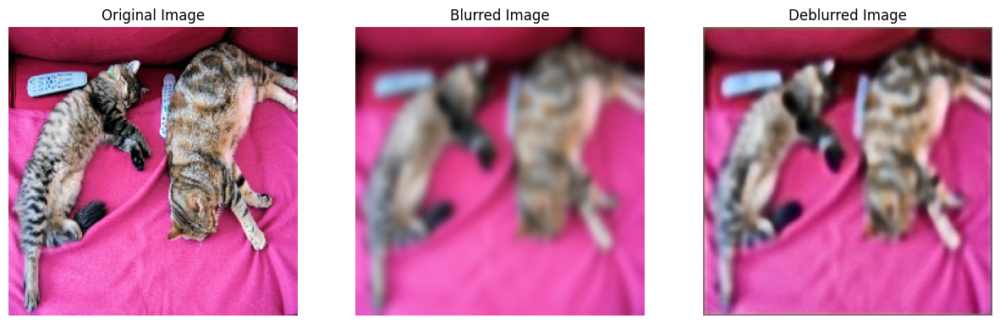

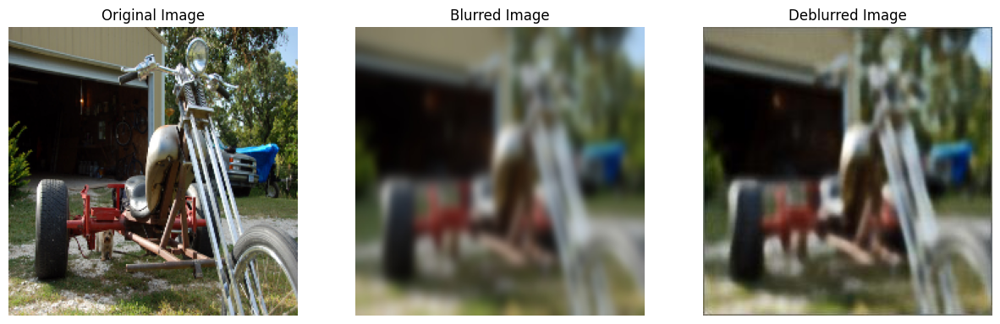

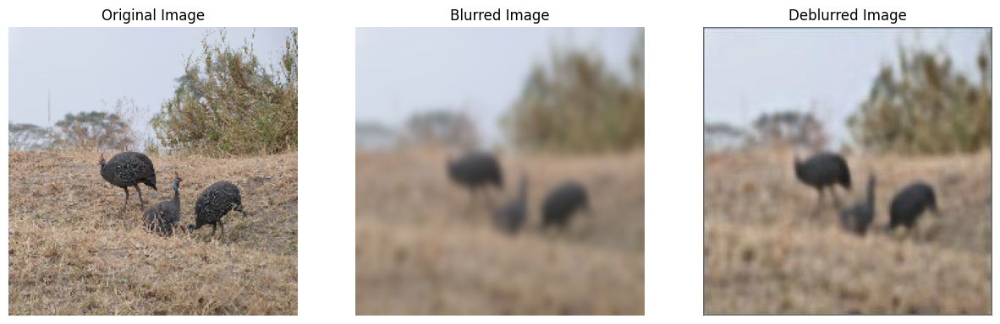

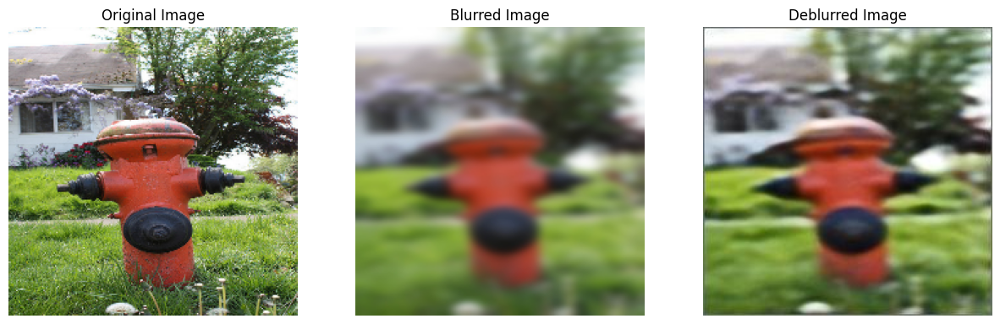

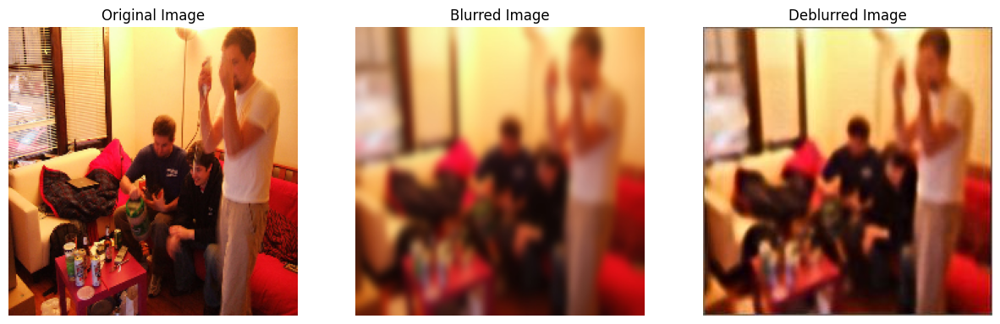

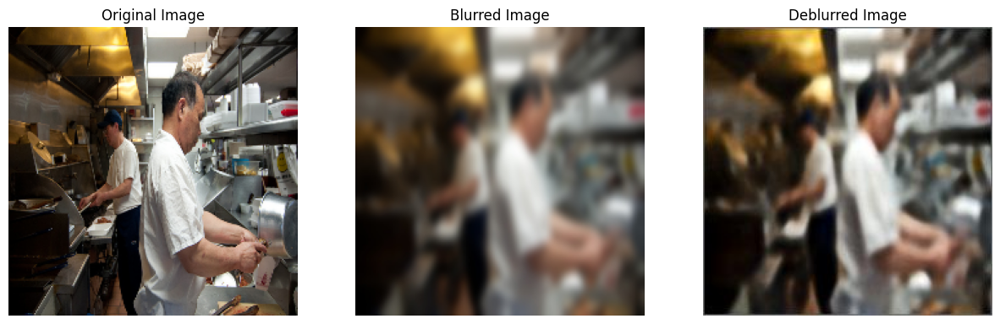

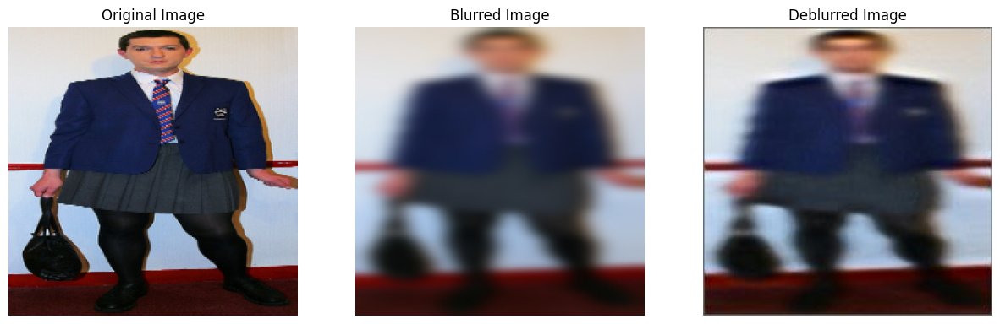

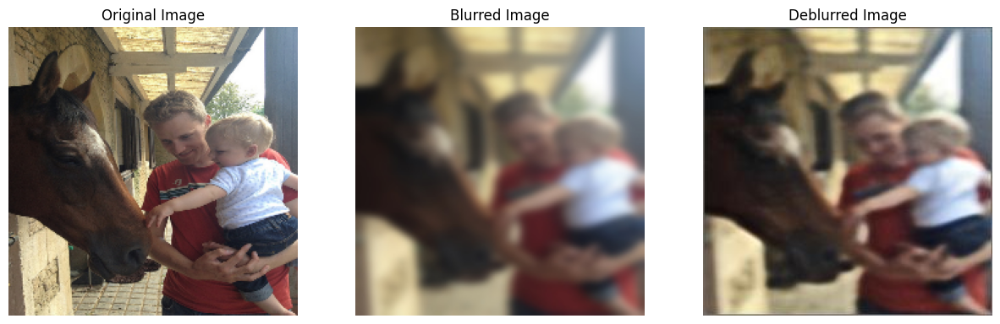

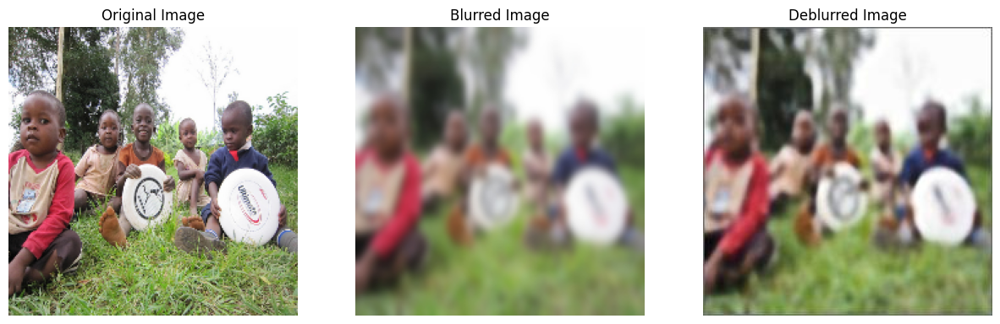

In [37]:
iterations = 0

for file in test_images:
    if iterations >= 9:
        break

    # Read images
    orig_image = plt.imread(f"../input/sharp/{file}")
    blur_image = plt.imread(f"../input/gaussian_blurred/{file}")
    deblur_image = plt.imread(f"../outputs/test_deblurred_images/deblurred_{file}")

    # Resize images to (224, 224)
    orig_image = cv2.resize(orig_image, (224, 224))
    blur_image = cv2.resize(blur_image, (224, 224))
    deblur_image = cv2.resize(deblur_image, (224, 224))

    # Plot side by side
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(orig_image)
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(blur_image)
    plt.title('Blurred Image')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(deblur_image)
    plt.title('Deblurred Image')
    plt.axis('off')

    plt.show()

    iterations += 1

Here we compare the blurring of an image from the original dataset and the blurring of an image from our dataset:

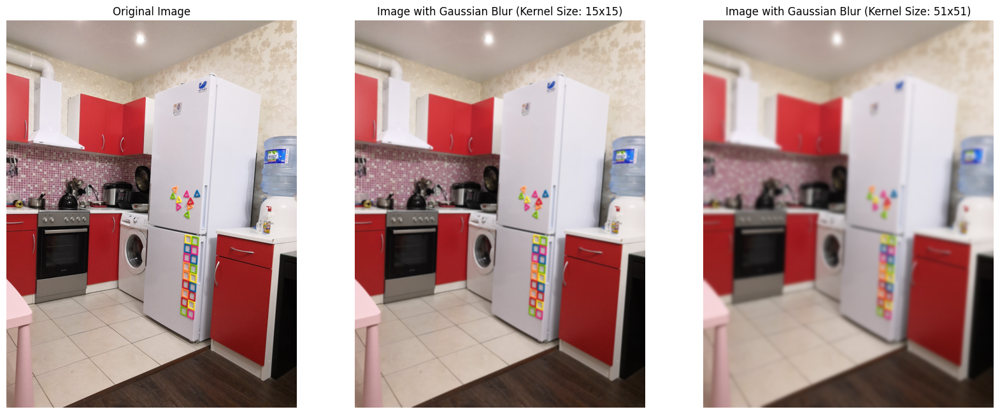

In [38]:
src_dir = '../test_data/sharp/'
images = os.listdir(src_dir)
dst_dir = '../test_data/gaussian_blurred'

img = cv2.imread(f"{src_dir}/orig_dataset.jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
blur_15 = cv2.GaussianBlur(img, (15, 15), 0)
cv2.imwrite(f"{dst_dir}/15_orig_dataset.jpg", blur_15)
blur_51 = cv2.GaussianBlur(img, (51, 51), 0)
cv2.imwrite(f"{dst_dir}/51_orig_dataset.jpg", blur_51)

plt.figure(figsize=(20, 8))

plt.subplot(1, 3, 1)
plt.imshow(img)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(blur_15)
plt.title('Image with Gaussian Blur (Kernel Size: 15x15)')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(blur_51)
plt.title('Image with Gaussian Blur (Kernel Size: 51x51)')
plt.axis('off')

plt.show()

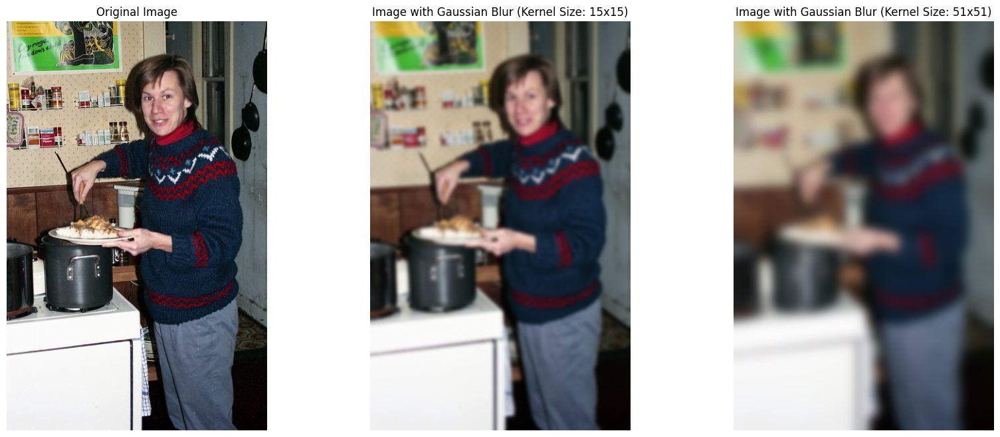

In [39]:
img = cv2.imread(f"{src_dir}/our_dataset_COCO.jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
blur_15 = cv2.GaussianBlur(img, (15, 15), 0)
cv2.imwrite(f"{dst_dir}/15_our_dataset_COCO.jpg", blur_15)
blur_51 = cv2.GaussianBlur(img, (51, 51), 0)
cv2.imwrite(f"{dst_dir}/51_our_dataset_COCO.jpg", blur_51)

plt.figure(figsize=(20, 8))

plt.subplot(1, 3, 1)
plt.imshow(img)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(blur_15)
plt.title('Image with Gaussian Blur (Kernel Size: 15x15)')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(blur_51)
plt.title('Image with Gaussian Blur (Kernel Size: 51x51)')
plt.axis('off')

plt.show()

After retraining the model with 15x15 using our chosen dataset:

In [45]:
# Specify the path to your text file containing image names
file_path = "../test_data/test_set_our_dataset_less_blur.txt"

# Read image names from the file
with open(file_path, 'r') as file:
    test_images = [line.strip() for line in file]

In [46]:
def save_decoded_image(img, name):
    img = img.view(img.size(0), 3, 224, 224)
    save_image(img, name)

device = 'cpu'

# load the trained model
model = models.CNN().to(device).eval()
model.load_state_dict(torch.load('../outputs/model_our_dataset_less_blur.pth', map_location=torch.device('cpu')))

# define transforms
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

In [47]:
iterations = 0

for name in test_images:
    if iterations >= 9:
        break
    image = cv2.imread(f"../input/gaussian_blurred/{name}")
    orig_image = image.copy()
    orig_image = cv2.resize(orig_image, (224, 224))
    #cv2.imwrite(f"../outputs/test_deblurred_images/blurred_{name}", orig_image)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    image = transform(image).unsqueeze(0)
    print(image.shape)

    with torch.no_grad():
        outputs = model(image)
        save_decoded_image(outputs.cpu().data, name=f"../outputs/test_deblurred_images/deblurred_{name}")


    iterations += 1
    #print(image.shape)



torch.Size([1, 3, 224, 224])


torch.Size([1, 3, 224, 224])
torch.Size([1, 3, 224, 224])
torch.Size([1, 3, 224, 224])
torch.Size([1, 3, 224, 224])
torch.Size([1, 3, 224, 224])
torch.Size([1, 3, 224, 224])
torch.Size([1, 3, 224, 224])
torch.Size([1, 3, 224, 224])


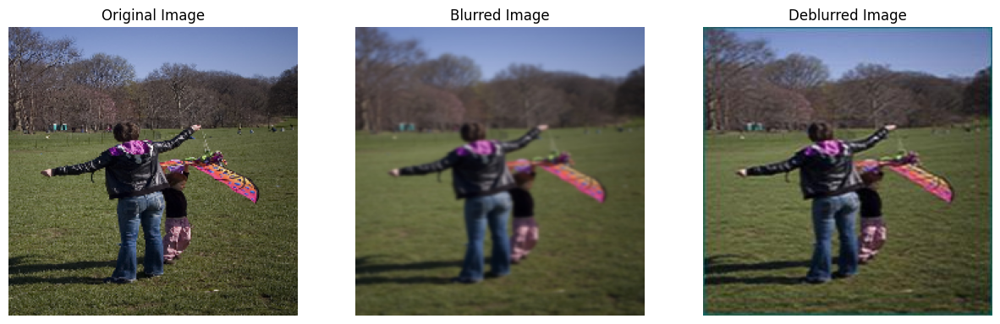

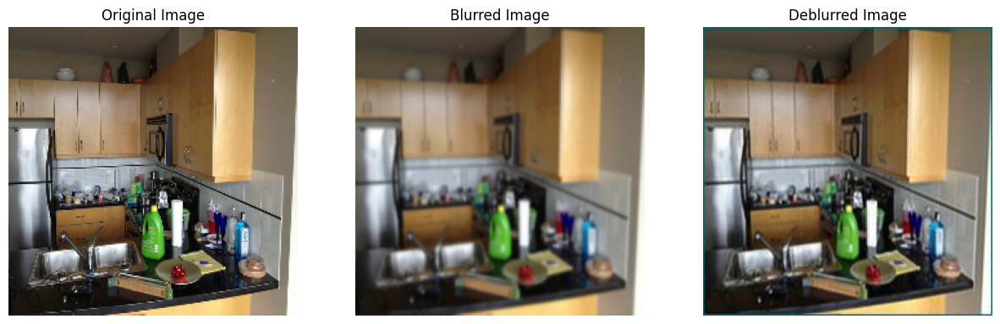

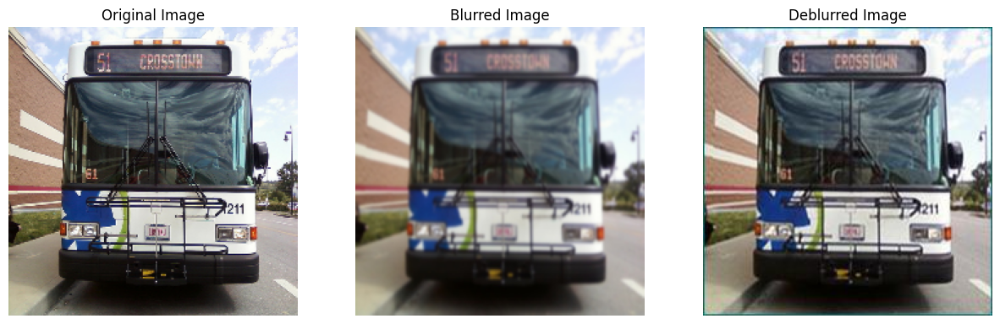

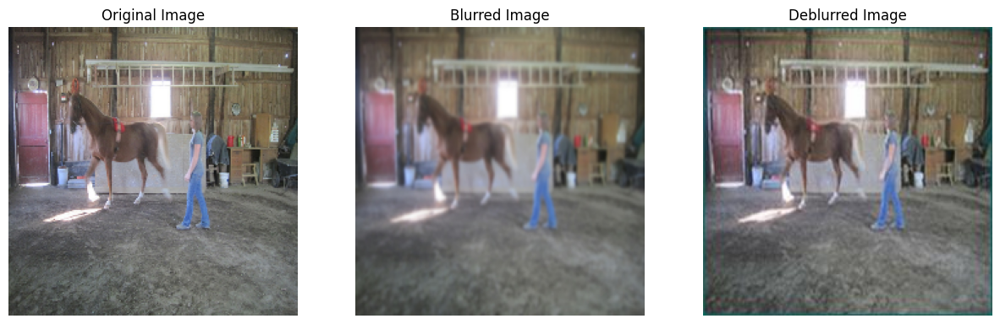

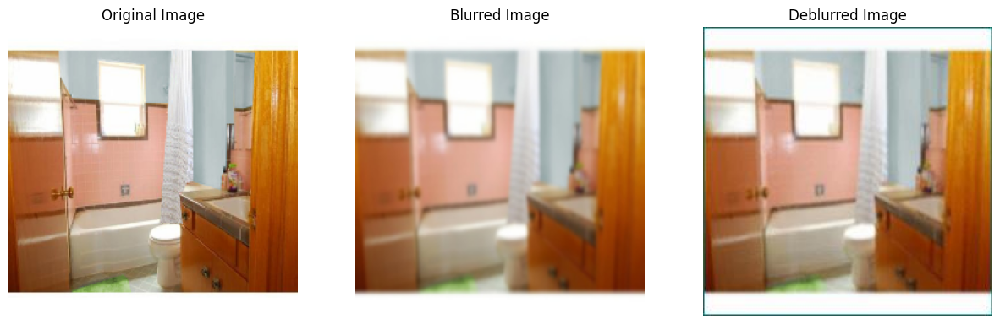

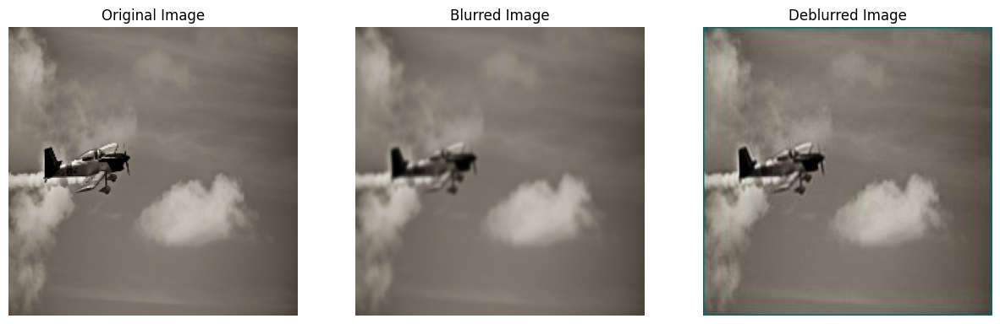

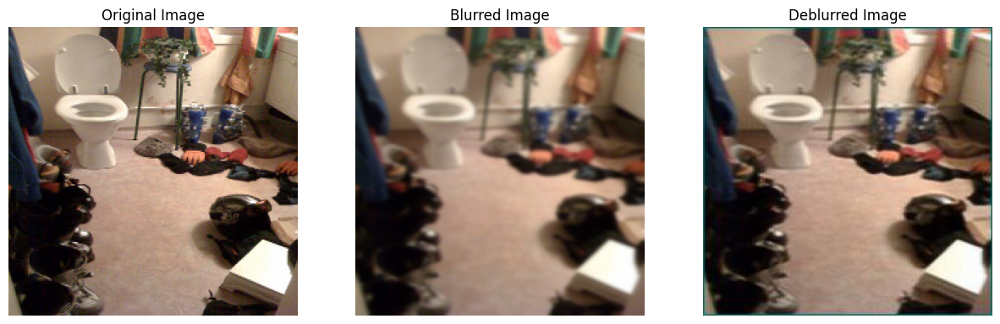

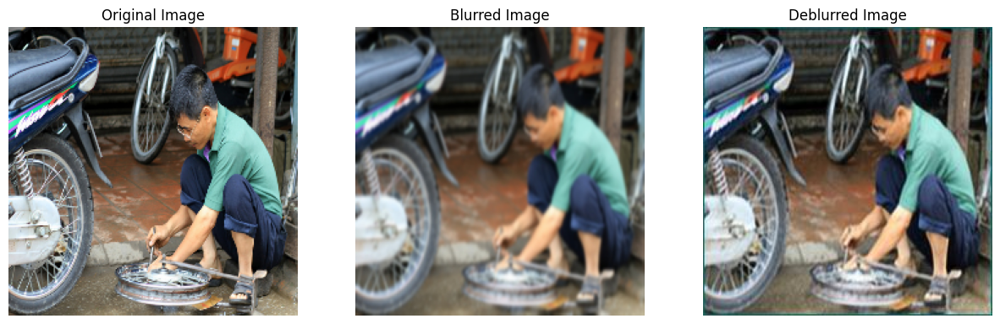

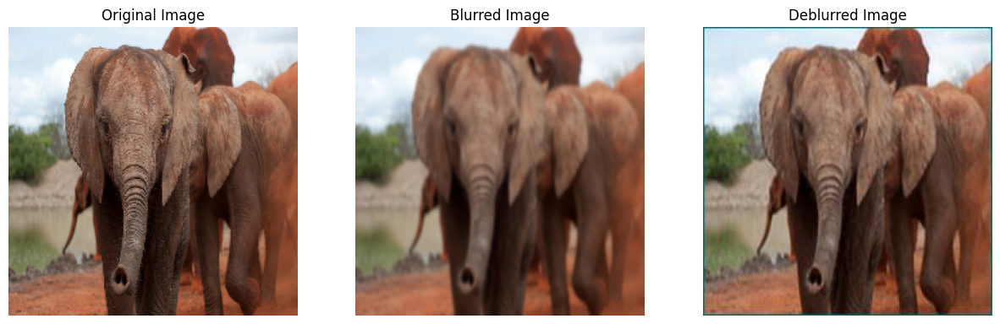

In [48]:
iterations = 0

for file in test_images:
    if iterations >= 9:
        break

    # Read images
    orig_image = plt.imread(f"../input/sharp/{file}")
    blur_image = plt.imread(f"../input/gaussian_blurred/{file}")
    deblur_image = plt.imread(f"../outputs/test_deblurred_images/deblurred_{file}")

    # Resize images to (224, 224)
    orig_image = cv2.resize(orig_image, (224, 224))
    blur_image = cv2.resize(blur_image, (224, 224))
    deblur_image = cv2.resize(deblur_image, (224, 224))

    # Plot side by side
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(orig_image)
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(blur_image)
    plt.title('Blurred Image')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(deblur_image)
    plt.title('Deblurred Image')
    plt.axis('off')

    plt.show()

    iterations += 1